# How to finetune a CV task

In [14]:
!pip install -U -qq torch torchvision umap-learn timm thop tensorboard dlib face_recognition

## 1. Exploratory Data Analysis

In [1]:
import glob
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.utils.data.dataset import Dataset
import torchvision
import torchvision.transforms as transforms
from torchvision.io import read_image
from torchvision.utils import make_grid
from torch.optim.lr_scheduler import OneCycleLR

import timm
from tqdm import tqdm
from thop import profile

/Users/ArthurLiu/opt/anaconda3/envs/py39/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## 1.1 Sequential viewing

In [2]:
def show_samples(sample_path):
    imgs = []
    resize = transforms.Resize((256, 256))
    for path in sample_path:
        imgs.append(resize(read_image(path)))
    grid = make_grid(imgs, nrow=10)
    img = transforms.ToPILImage()(grid)

    plt.figure(dpi=200)
    plt.imshow(img)

 **** Num of train mask: 1286


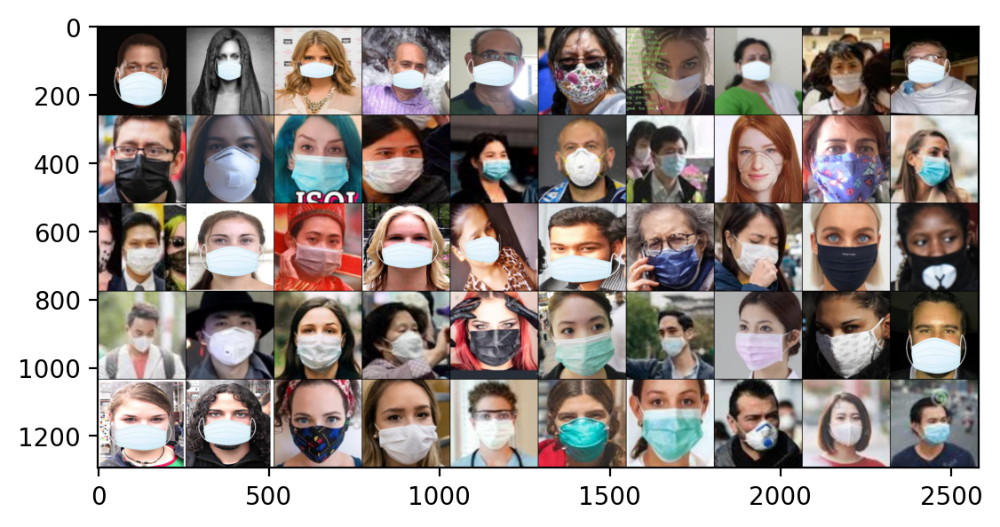

In [3]:
# Visualize masked pics in the training set
train_mask = glob.glob("data/mask/train/mask/*")
print(f" **** Num of train mask: {len(train_mask)}")
show_samples(train_mask[50:100])

 **** Num of train without mask: 1476


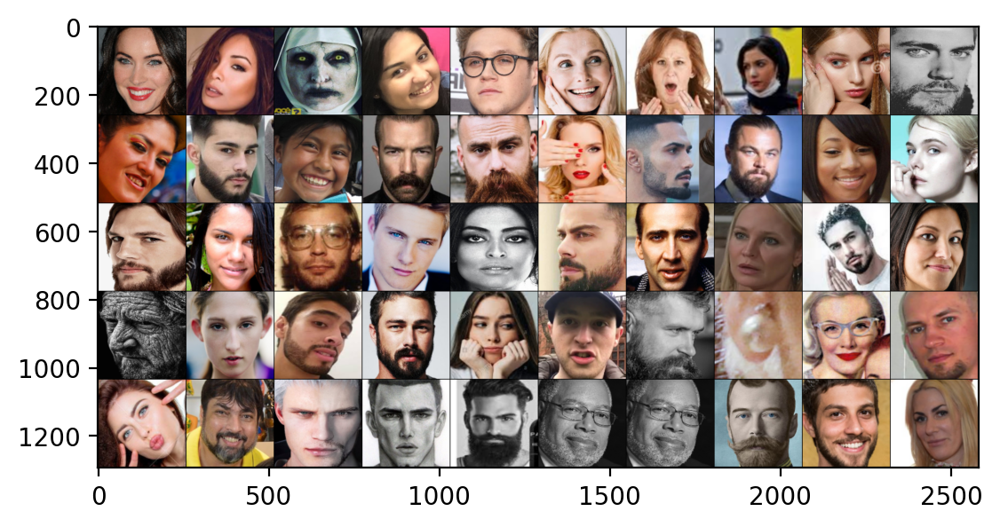

In [4]:
# Visualize without mask pics in the training set
train_unmask = glob.glob("data/mask/train/without_mask/*")
print(f" **** Num of train without mask: {len(train_unmask)}")
show_samples(train_unmask[50:100])

 **** Num of valid mask: 685


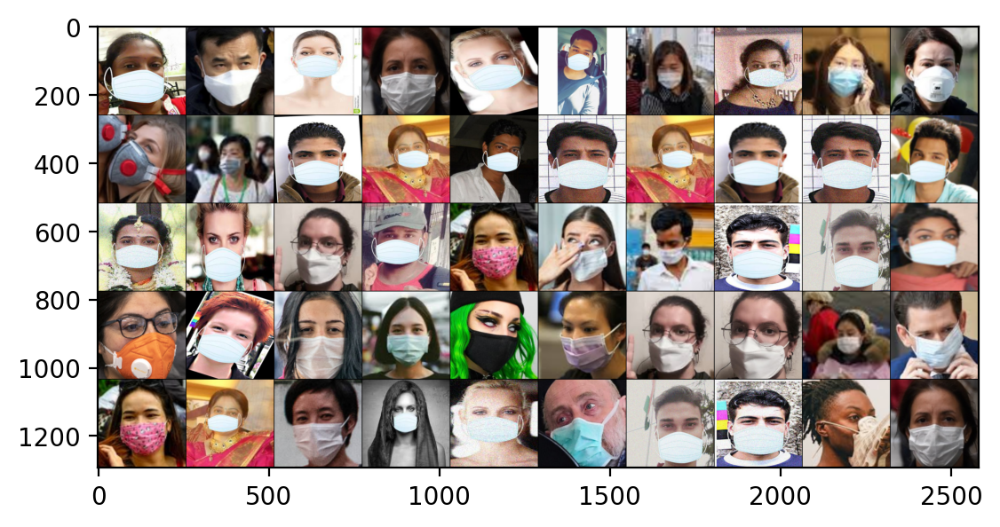

In [5]:
# Visualize masked pics in the validing set
val_mask = glob.glob("data/mask/val/mask/*")
print(f" **** Num of valid mask: {len(val_mask)}")
show_samples(val_mask[100:150])

 **** Num of valid without mask: 686


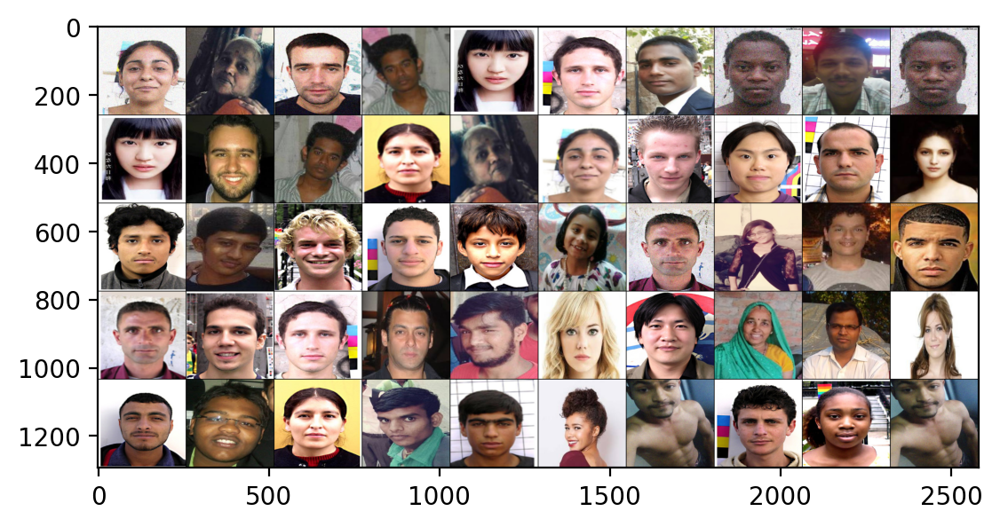

In [6]:
# Visualize without mask pics in the validing set
val_unmask = glob.glob("data/mask/val/without_mask/*")
print(f" **** Num of valid without mask: {len(val_unmask)}")
show_samples(val_unmask[100:150])

## 1.2 Standardize train-set & valid-set

In [7]:
df_train_1 = pd.DataFrame({'path': train_mask, 'target': 1})
df_train_2 = pd.DataFrame({'path': train_unmask, 'target': 0})
df_valid_1 = pd.DataFrame({'path': val_mask, 'target': 1})
df_valid_2 = pd.DataFrame({'path': val_unmask, 'target': 0})

In [8]:
df_train = pd.concat([df_train_1, df_train_2])
df_valid = pd.concat([df_valid_1, df_valid_2])

In [9]:
df_train['target'].value_counts()

target
0    1476
1    1286
Name: count, dtype: int64

In [10]:
df_valid['target'].value_counts()

target
0    686
1    685
Name: count, dtype: int64

In [11]:
df_train.to_csv('data/mask/train.csv')
df_valid.to_csv('data/mask/valid.csv')

In [12]:
!ls -al data/mask

total 408
drwxrwxrwx@ 7 ArthurLiu  staff     224 Aug 27 22:39 .
drwxr-xr-x  5 ArthurLiu  staff     160 Aug 27 10:27 ..
-rw-r--r--@ 1 ArthurLiu  staff    6148 Aug 28 20:28 .DS_Store
drwxrwxrwx@ 5 ArthurLiu  staff     160 Aug 25 17:56 train
-rw-r--r--  1 ArthurLiu  staff  113893 Aug 28 20:45 train.csv
drwxrwxrwx@ 5 ArthurLiu  staff     160 Aug 28 20:15 val
-rw-r--r--  1 ArthurLiu  staff   59009 Aug 28 20:45 valid.csv


## 1.3 Cluster viewing

In [13]:
device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
device

'cpu'

### (1) Extract features

In [14]:
class LiamDataset(Dataset):
    def __init__(self, img_path, img_label, transform=None):
        self.img_path = img_path
        self.img_label = img_label
        if transform is not None:
            self.transform = transform
        else:
            self.transform = None
    
    def __getitem__(self, index):
        img = Image.open(self.img_path[index]).convert('RGB')
        if self.transform is not None:
            img = self.transform(img)
        return img, torch.from_numpy(np.array(self.img_label[index]))
    
    def __len__(self):
        return len(self.img_path)

In [15]:
train_loader = torch.utils.data.DataLoader(
    LiamDataset(train_mask, [1] * len(train_mask), 
        transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    ), batch_size=64, shuffle=False, pin_memory=False
)

In [16]:
def extract_features(liam_loader):
    model = timm.create_model('resnet18')
    model.fc = nn.Identity()
    model.to(device)
    
    features = []
    with torch.no_grad():
        for x, y in tqdm(liam_loader):
            feat = model(x.to(device))
            features.append(feat.data.cpu().numpy())
    return np.vstack(features[:])

In [17]:
train_feat = extract_features(train_loader)

100%|██████████| 21/21 [01:59<00:00,  5.68s/it]


In [18]:
train_feat.shape

(1286, 512)

### (2) Dimensionality Reduction

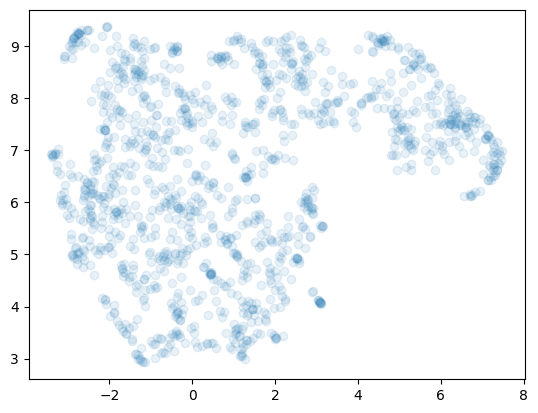

In [19]:
from umap import UMAP
embedding = UMAP().fit_transform(train_feat)

plt.scatter(
    embedding[:, 0], embedding[:, 1], alpha=0.1
)

### (3) KMeans clustering

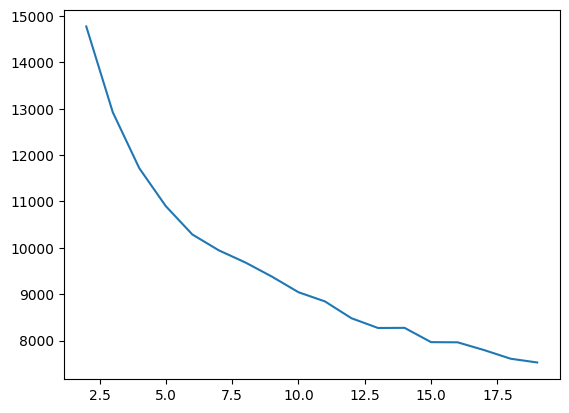

In [20]:
from sklearn.cluster import MiniBatchKMeans

sse = []
for n in range(2, 20):
    km = MiniBatchKMeans(max_iter=3000, n_clusters=n, n_init=10)
    km.fit(train_feat)
    sse.append(km.inertia_)
    
plt.plot(range(2, 20), sse)

In [21]:
km = MiniBatchKMeans(max_iter=3000, n_clusters=13, n_init=10)
km.fit(train_feat)

MiniBatchKMeans(max_iter=3000, n_clusters=13, n_init=10)

In [22]:
def show_cluster(sample_path, km, label):
    imgs = []
    resize = transforms.Resize((256, 256))
    for idx in np.where(km.labels_==label)[0][:50]:
        imgs.append(resize(read_image(sample_path[idx])))
    grid = make_grid(imgs, nrow=10)
    img = transforms.ToPILImage()(grid)

    plt.figure(dpi=200)
    plt.imshow(img)

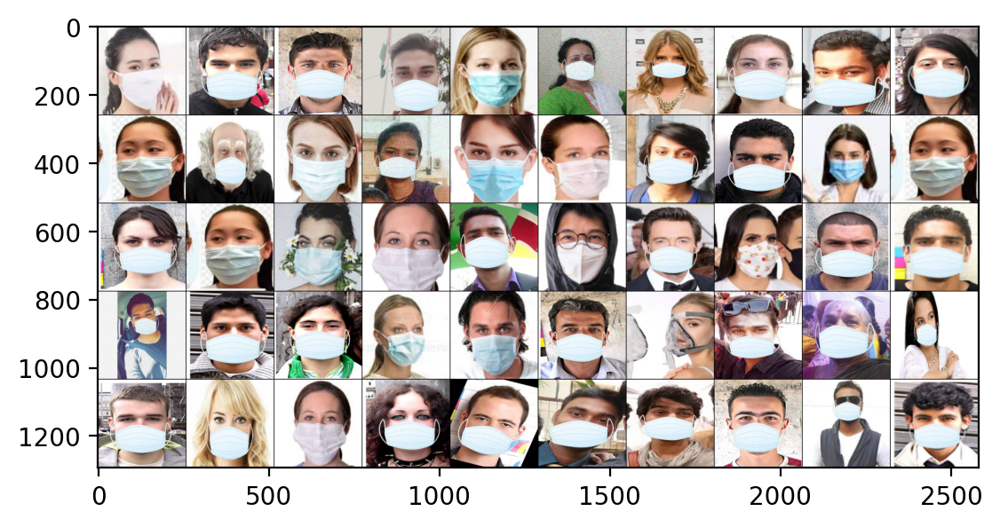

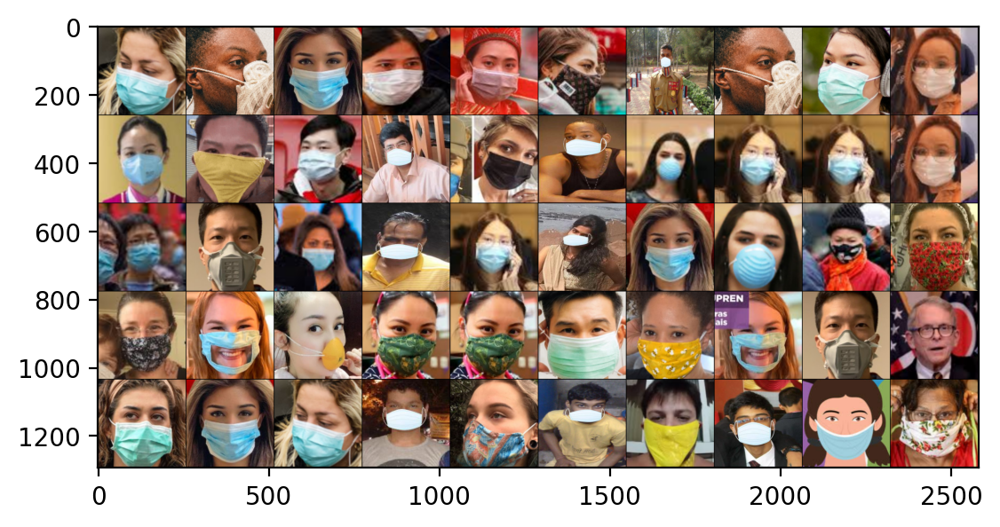

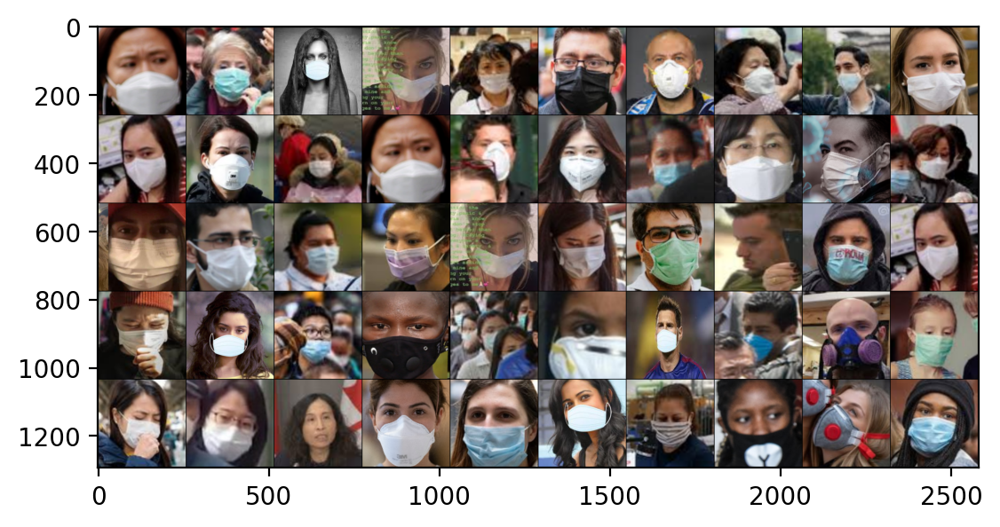

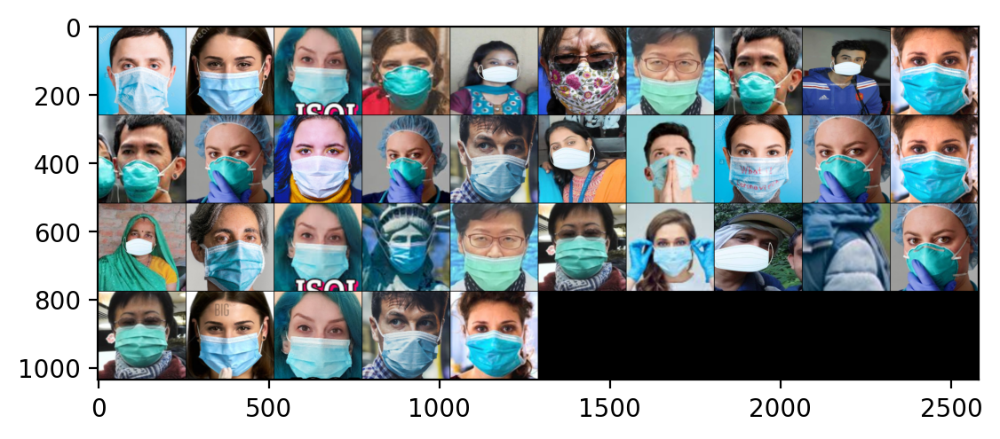

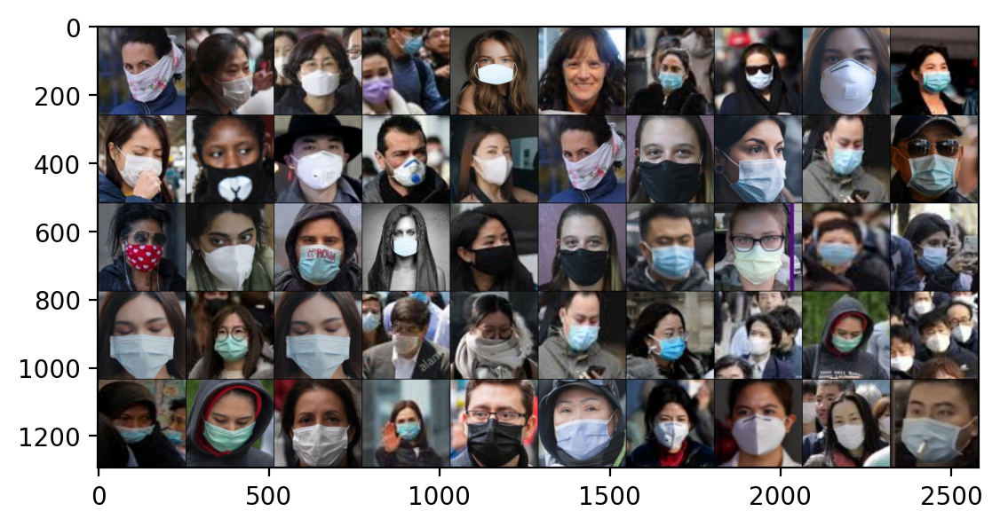

In [23]:
for i in range(5):
    show_cluster(train_mask, km, i)

### (4) DBSCAN Clustering

In [24]:
from sklearn.cluster import DBSCAN

km = DBSCAN()
km.fit(embedding)

DBSCAN()

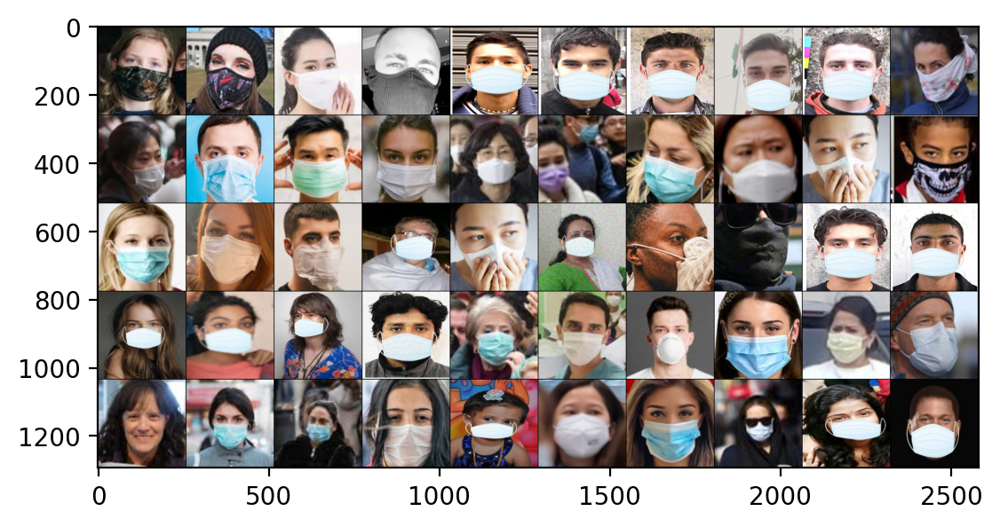

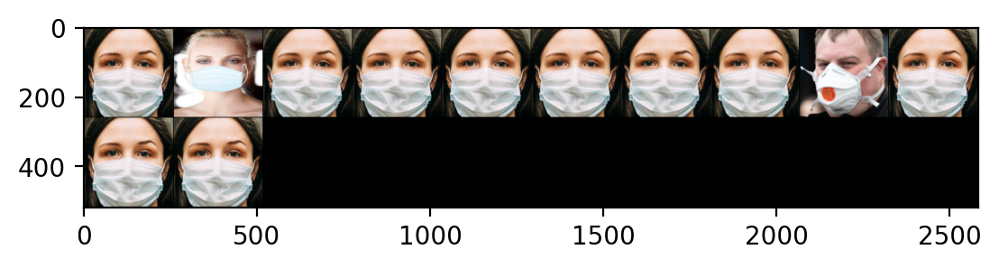

In [31]:
for i in range(2):
    show_cluster(train_mask, km, i)

## 2. Base model choosing
- https://github.com/huggingface/pytorch-image-models/blob/main/results/results-imagenet.csv
- top1, top5, param_count

In [83]:
base_model = "resnet18d.ra2_in1k"
model = timm.create_model(base_model, pretrained=True, num_classes=2)
model

ResNet(
  (conv1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  )
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act1): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop_block): Identity()
   

In [108]:
# Get the configuration of model pretrained
model.pretrained_cfg

{'url': 'https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/resnet18d_ra2-48a79e06.pth',
 'hf_hub_id': 'timm/resnet18d.ra2_in1k',
 'architecture': 'resnet18d',
 'tag': 'ra2_in1k',
 'custom_load': False,
 'input_size': (3, 224, 224),
 'test_input_size': (3, 288, 288),
 'fixed_input_size': False,
 'interpolation': 'bicubic',
 'crop_pct': 0.875,
 'test_crop_pct': 0.95,
 'crop_mode': 'center',
 'mean': (0.485, 0.456, 0.406),
 'std': (0.229, 0.224, 0.225),
 'num_classes': 1000,
 'pool_size': (7, 7),
 'first_conv': 'conv1.0',
 'classifier': 'fc',
 'origin_url': 'https://github.com/huggingface/pytorch-image-models'}

In [109]:
# Get the data configuration
data_config = timm.data.resolve_model_data_config(model)
data_config

{'input_size': (3, 224, 224),
 'interpolation': 'bicubic',
 'mean': (0.485, 0.456, 0.406),
 'std': (0.229, 0.224, 0.225),
 'crop_pct': 0.875,
 'crop_mode': 'center'}

In [111]:
# Tranfer to  transform
transform = timm.data.create_transform(**data_config)
transform

Compose(
    Resize(size=256, interpolation=bicubic, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    ToTensor()
    Normalize(mean=tensor([0.4850, 0.4560, 0.4060]), std=tensor([0.2290, 0.2240, 0.2250]))
)

In [117]:
# Get total parameters of the model
input = torch.randn(1, 3, 244, 244)
_, params = profile(model, inputs=(input,))
print(f"Total parameters in MB: {params / (1024 * 1024)}M")

[INFO] Register count_convNd() for <class 'torch.nn.modules.conv.Conv2d'>.
[INFO] Register count_normalization() for <class 'torch.nn.modules.batchnorm.BatchNorm2d'>.
[INFO] Register zero_ops() for <class 'torch.nn.modules.activation.ReLU'>.
[INFO] Register zero_ops() for <class 'torch.nn.modules.container.Sequential'>.
[INFO] Register zero_ops() for <class 'torch.nn.modules.pooling.MaxPool2d'>.
[INFO] Register count_avgpool() for <class 'torch.nn.modules.pooling.AvgPool2d'>.
[INFO] Register count_adap_avgpool() for <class 'torch.nn.modules.pooling.AdaptiveAvgPool2d'>.
[INFO] Register count_linear() for <class 'torch.nn.modules.linear.Linear'>.
Total parameters in MB: 10.678071975708008M


## 3. Learning rate visualizing

In [79]:
model = nn.Linear(2, 1)

In [80]:
class CFG:
    max_lr = 3e-4
    num_epochs = 10
    num_steps = 100

/Users/ArthurLiu/opt/anaconda3/envs/py39/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


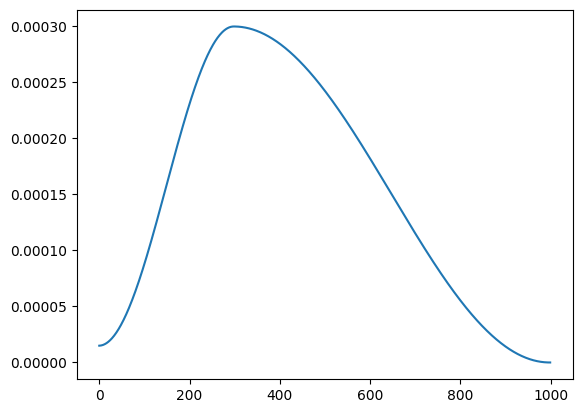

In [81]:
optimizer = torch.optim.Adam(model.parameters(), lr=CFG.max_lr)
scheduler = OneCycleLR(
    optimizer, 
    max_lr=CFG.max_lr, 
    steps_per_epoch=CFG.num_steps, 
    epochs=CFG.num_epochs,
    div_factor=20, #初始lr, 默认25，不宜过小
    final_div_factor=1000, #最后lr会除以这个因子，默认值是10000.0，不宜过小
    anneal_strategy='cos'
)

lrs = []
for epoch in range(CFG.num_epochs):
    for step in range(CFG.num_steps):
        scheduler.step()
        lrs.append(optimizer.param_groups[0]['lr'])

plt.plot(lrs)